In [1]:
from imports import *

# set columnns display format
pd.set_option('display.max_columns', None)
# default pandas decimal number display format
# pd.options.display.float_format = '{:20,.3f}'.format

# Data Acquisition

In [2]:
# import raw, messy data
df = acquire.get_zillow_data()

In [3]:
df.shape

(52438, 67)

# Data Preparation

### Missing Value Analysis

<AxesSubplot:>

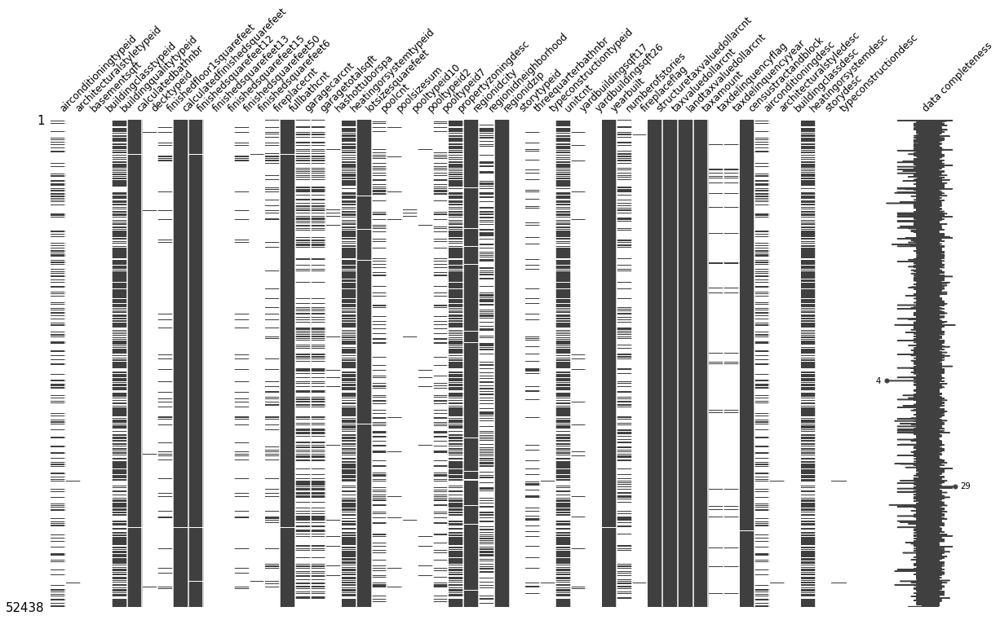

In [5]:
# Visualizing missing values
missingValueColumns = df.columns[df.isnull().any()].tolist()

msno.matrix(df[missingValueColumns], width_ratios = (10, 1), \
           figsize=(20,11), fontsize = 12, sparkline=True, labels = True)

In [4]:
# Cleaned dataframe
df = prepare.prep_zillow(df)

In [5]:
df.shape

(45130, 23)

In [6]:
train, validate, test = prepare.split(df)
train.shape, validate.shape, test.shape

((25272, 23), (10832, 23), (9026, 23))

# EDA

## Feature Correlation

In [38]:
train_corr = train.corr()

<AxesSubplot:>

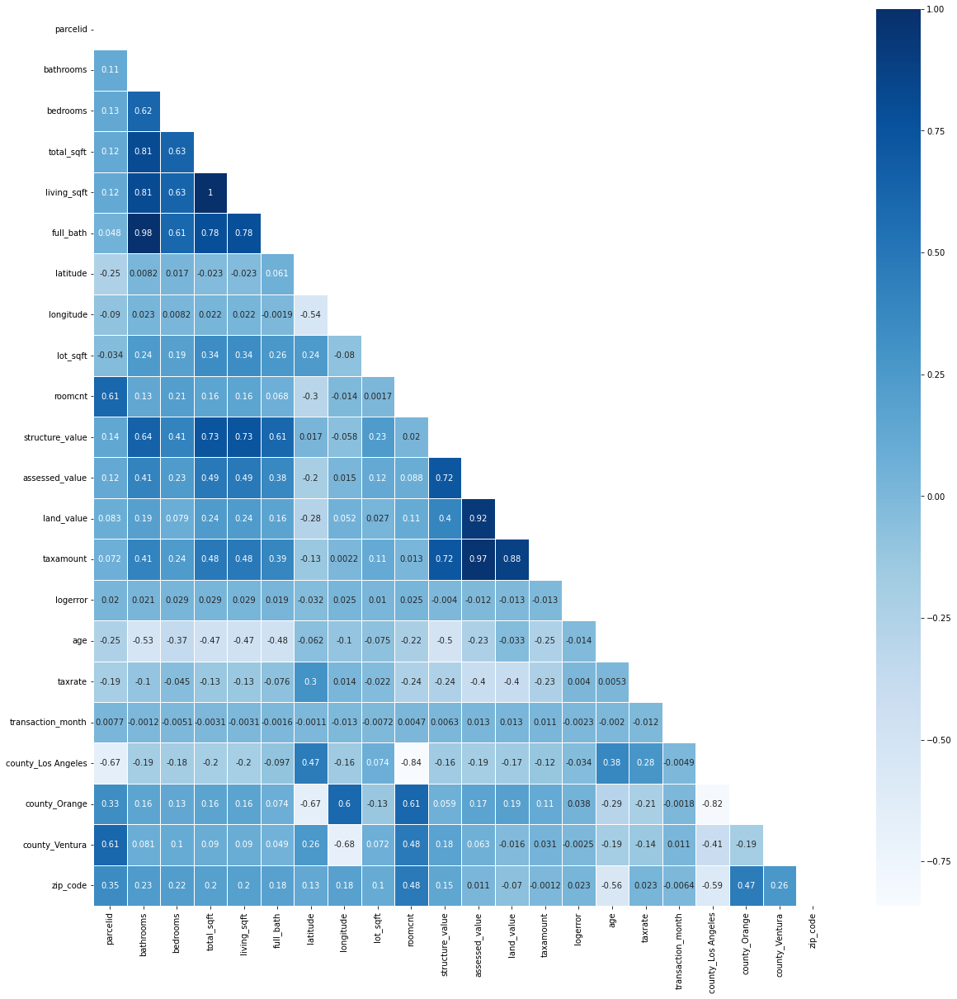

In [39]:
plt.figure(figsize = (20,20))
sns.heatmap(train_corr,cmap='Blues', annot=True, linewidth=0.5, mask= np.triu(train_corr))

## Observations:
- **living_sqft** and **total_sqft** are strongly correlated (r=1)
- **full_bath** and **bathrooms** are strongly correlated (r=0.98), somewhat strongly related with **total_sqft**, **living_sqft** (r=0.78)
- **structure_value** somewhat stronglyr correlated with **assessed_value** (r=0.72), **total_sqft**, **living_sqft** (0.73)
- **land_value** and **assessed_value** are strongly correlated (0.92)
- **tax_amount** and **assessed_value** are strongly correlated (0.97), **land_value** (r=0.88), **structure_value** (0.72)
- **county_Orange** are somewhat strongly correlated with **longitude**, **roomcnt** (r=0.6)

## Question 1: Is log error significantly different across different counties?

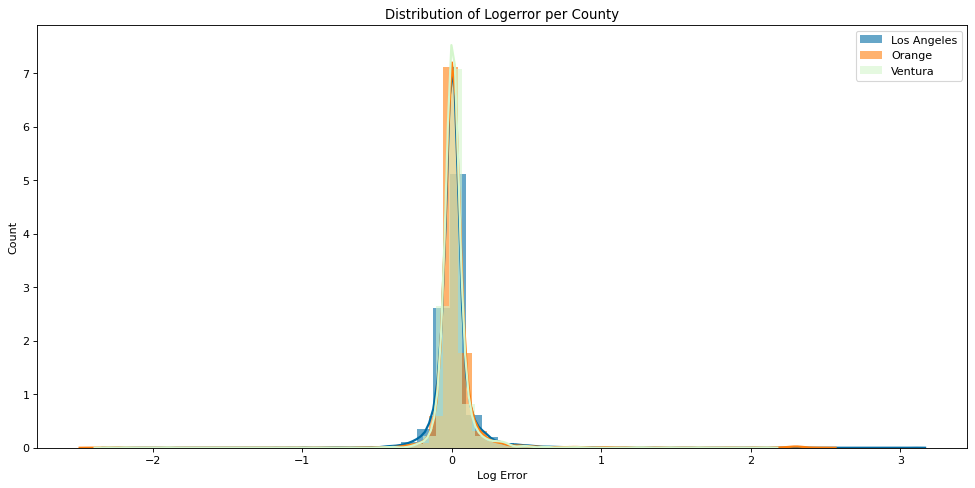

In [7]:
# Visualizing distribution of assessed_value per county

losangeles = train[train['county'] == 'Los Angeles'].logerror
orange = train[train['county'] == 'Orange'].logerror
ventura = train[train['county'] == 'Ventura'].logerror

kwargs = dict(hist_kws={'alpha':.6}, kde_kws={'linewidth':2})
plt.figure(figsize=(15,7), dpi= 80)
sns.distplot(losangeles, color="#006ba4", label="Los Angeles", **kwargs)
sns.distplot(orange, color="#ff800e", label="Orange", **kwargs)
sns.distplot(ventura, color="#D4F6CC", label="Ventura", **kwargs)
plt.xlabel('Log Error')
plt.ylabel('Count')
plt.title('Distribution of Logerror per County')
plt.legend();

<AxesSubplot:xlabel='county', ylabel='logerror'>

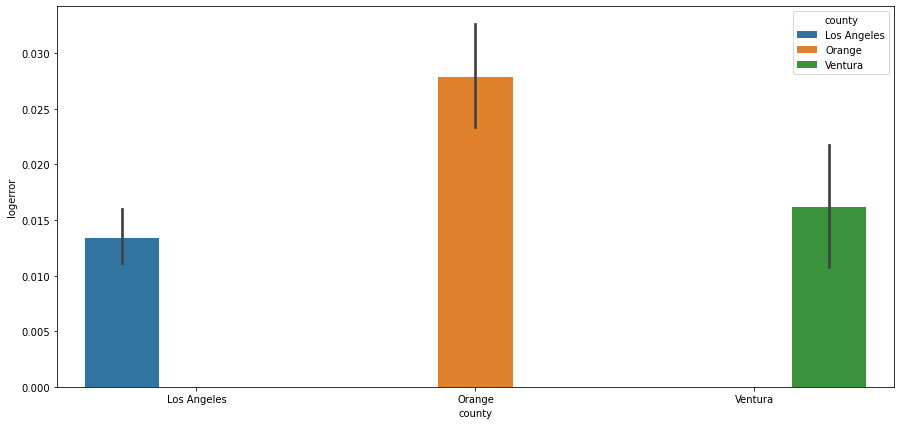

In [8]:
# CHANGE COLOR!!!
plt.figure(figsize=(15,7))
sns.barplot(x='county', y='logerror',hue = 'county', data = train)

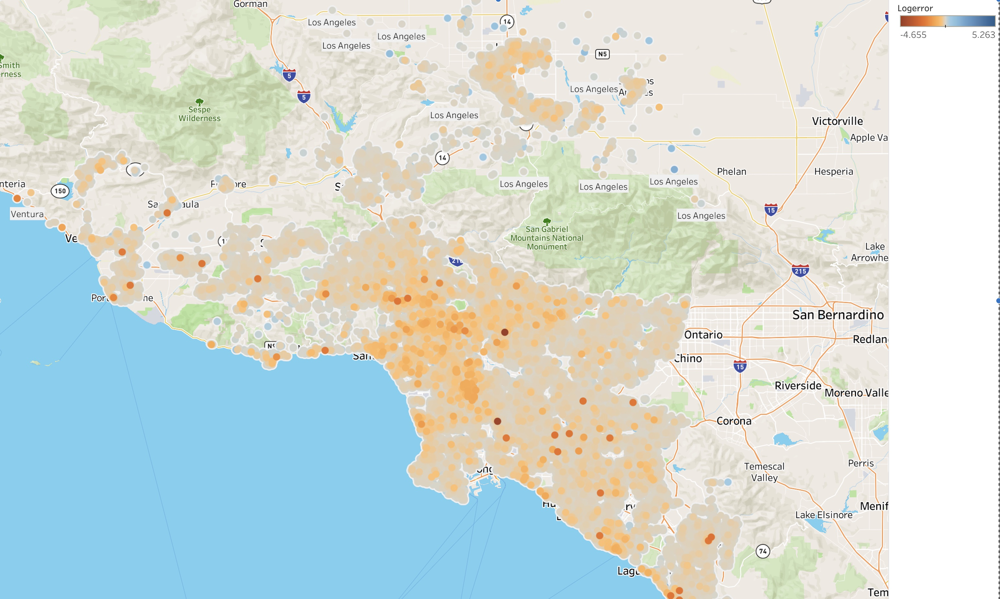

### ANOVA Test
**Set Hypothesis**

$H_{0}$: Logerror of Los Angeles, Orange, and Ventura County are all equal.

$H_{a}$: Logerror of property tax assessed value of Los Angeles, Orange, and Ventura County are not all equal.


**Verify Assumptions**

- Normal: Yes
- Independent: Yes
- Variance: False

In [78]:
# Set alpha
alpha = 0.05

# Comparing mean of 3 independent samples
t, p = stats.f_oneway(losangeles, orange, ventura)
if p < alpha:
    print("We reject H0.")
    print(Fore.BLUE + '\nMean of log error of Los Angeles, Orange, and Ventura County are not all equal. ')
else:
    print("We fail to reject H0")

We reject H0.

Mean of log error of Los Angeles, Orange, and Ventura County are not all equal. 


## Follw up questions: what about latitude, longitude?

In [79]:
fig = px.scatter(train, x="longitude", y="latitude", color="logerror",color_continuous_scale='gnbu'
                 ,hover_data=['county'],width=900, height=600)
fig.show()

## what about zip_code?

In [35]:
df.zip_code.value_counts()

93536    684
93535    599
93550    495
93065    458
93551    420
        ... 
92970      1
91204      1
92397      1
93013      1
93563      1
Name: zip_code, Length: 470, dtype: int64

In [13]:
fig = px.scatter(train, x="zip_code", y="logerror", color="logerror",color_continuous_scale='gnbu'
                 ,hover_data=['county'],width=900, height=600)
fig.show()

In [14]:
overall_mean = train.logerror.mean()
overall_mean

0.01755665423435704

In [15]:
logerror_zip = train.groupby('zip_code').logerror.mean().reset_index()

In [17]:
logerror_zip.head()

,zip_code,logerror
0,90001,-0.028087
1,90002,0.001295
2,90003,-0.046705
3,90004,-0.042406
4,90005,0.027602


In [19]:
logerror_zip.shape

(457, 2)

In [57]:
for row in range(0,457):
    alpha = 0.05
    sample = train[train.zip_code ==logerror_zip['zip_code'][row]].logerror
    t, p = stats.ttest_1samp(sample, overall_mean)
    if p/2 < alpha:
        print('zip code ', logerror_zip['zip_code'][row], 'is significantly')
        if t>0:
            print('higher than the expected error.')
        else:
            print('lower than the expected error.')

zip code  90001 is significantly
lower than the expected error.
zip code  90008 is significantly
lower than the expected error.
zip code  90016 is significantly
lower than the expected error.
zip code  90024 is significantly
lower than the expected error.
zip code  90026 is significantly
lower than the expected error.
zip code  90034 is significantly
lower than the expected error.
zip code  90041 is significantly
lower than the expected error.
zip code  90045 is significantly
lower than the expected error.
zip code  90053 is significantly
lower than the expected error.
zip code  90061 is significantly
lower than the expected error.
zip code  90062 is significantly
lower than the expected error.
zip code  90064 is significantly
lower than the expected error.
zip code  90066 is significantly
lower than the expected error.
zip code  90069 is significantly
lower than the expected error.
zip code  90220 is significantly
lower than the expected error.
zip code  90232 is significantly
lower t

In [33]:
zip_result = pd.read_csv('logerror_zip.csv')

In [ ]:
# Visualizing logerror zip code bins
plt.figure(figsize=(15,7))
sns.barplot(x='zip_bin', y='logerror', palette = ['#023047','#6ecae6','#e0fbfc','#fD7702'], data = train)
plt.xlabel('Zip Code Bin', fontsize = 12)
plt.ylabel('Logerror', fontsize = 12)
plt.title('Logerror by Zip Code Bin', fontsize = 20)

## Question 2: Is there a relationship between log error and the age of the house?

Text(0.5, 1.0, 'Logerror by Age')

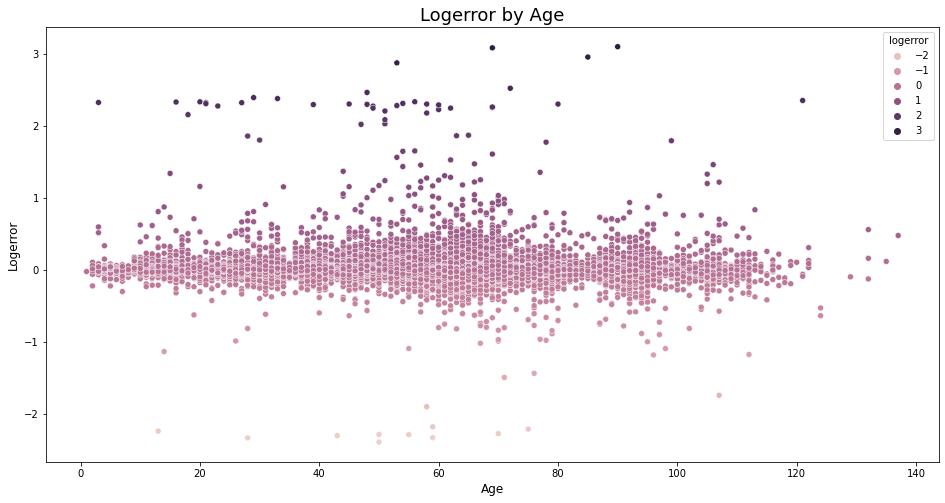

In [36]:
# Visualizing how age of the house is correlated with legerror
plt.figure(figsize = (16,8))
sns.scatterplot(x = train.age, y = train.logerror, data = train, hue=train.logerror)
plt.xlabel('Age', fontsize = 12)
plt.ylabel('Logerror', fontsize = 12)
plt.title('Logerror by Age', fontsize = 18)

### Pearson R
**Set Hypothesis**

$H_{0}$: Age of the property is not correlated with the logerror.

$H_{a}$: Age of the property is correlated with the logerror.

In [13]:
# Set alpha
alpha = 0.05

# Check how two samples are related
r, p = stats.pearsonr(train.logerror, train.age)
r, p

# Compare p to confidence interval and draw conclusion
if p < alpha:
    print("We reject H0.")
    print(Fore.BLUE + '\nAge of the property and logerrro are correlated. ')
else:
    print("We fail to reject H0")

We reject H0.

Age of the property and logerrro are correlated. 


## Quesetion 3: Is square feet correlated with log error? (`total_sqft`, `lot_sqft`, `living_sqft`)

#### total_sqft

<Figure size 288x432 with 0 Axes>

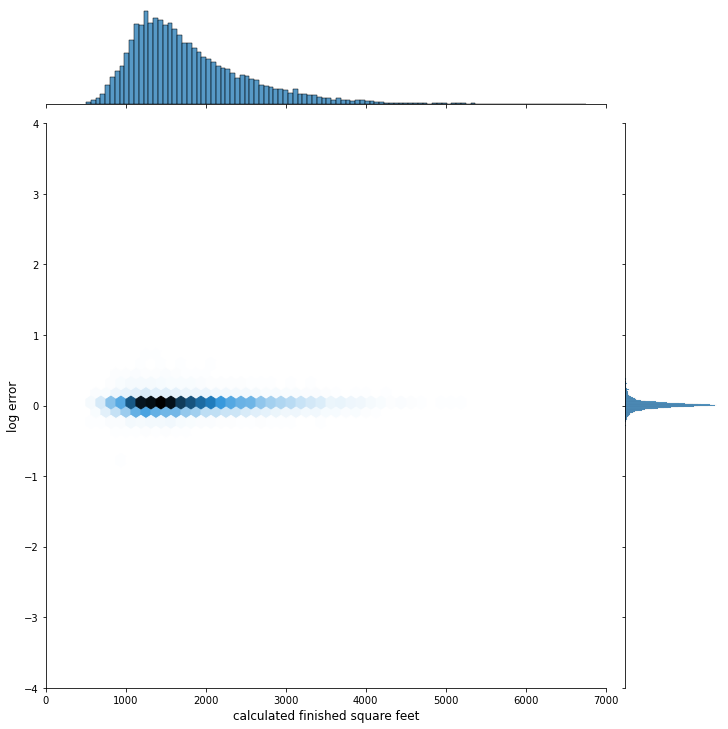

In [38]:
plt.figure(figsize=(4, 6))
sns.jointplot(x = train.total_sqft.values, 
             y = train.logerror.values, size = 10, kind = 'hex')
plt.xlim(0, 7000)
plt.ylim(-4,4)
plt.ylabel('log error', fontsize = 12)
plt.xlabel('calculated finished square feet', fontsize = 12)
plt.show()

Text(0.5, 1.0, 'Logerror by Calculated Finished Square Feet')

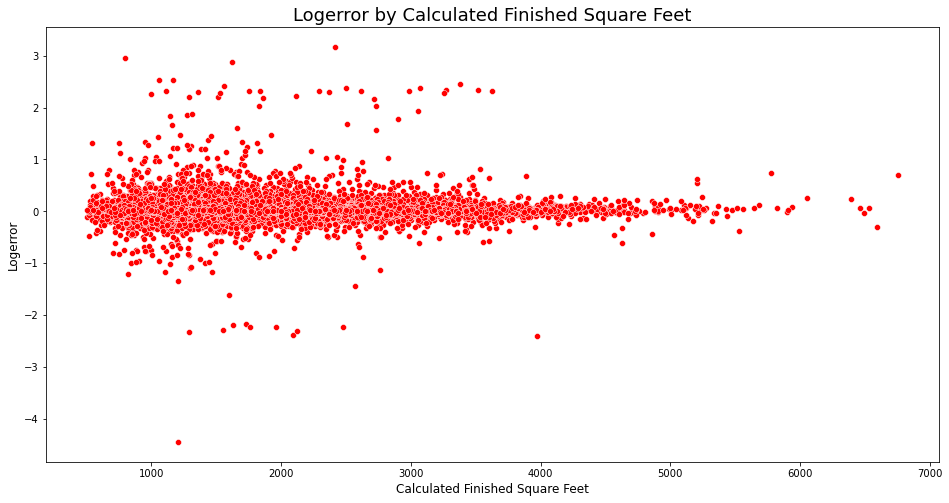

In [39]:
# Visualizing how logerror is correlated with square feet
plt.figure(figsize = (16,8))
sns.scatterplot(x = train.total_sqft, y = train.logerror, color = 'red', data = train)
plt.xlabel('Calculated Finished Square Feet', fontsize = 12)
plt.ylabel('Logerror', fontsize = 12)
plt.title('Logerror by Calculated Finished Square Feet', fontsize = 18)

#### lot_sqft

Text(0.5, 1.0, 'Logerror by Area of the Lot')

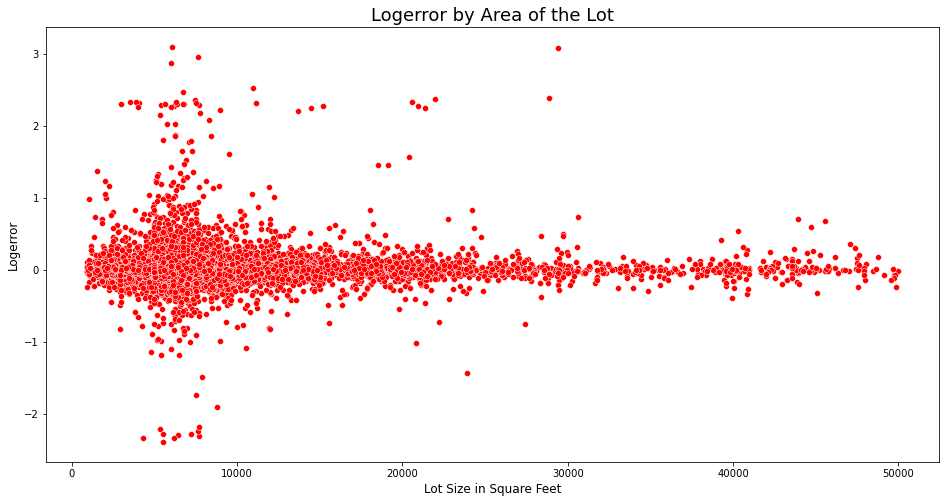

In [40]:
# Visualizing how logerror is correlated with square feet
plt.figure(figsize = (16,8))
sns.scatterplot(x = train.lot_sqft, y = train.logerror, color = 'red', data = train)
plt.xlabel('Lot Size in Square Feet', fontsize = 12)
plt.ylabel('Logerror', fontsize = 12)
plt.title('Logerror by Area of the Lot', fontsize = 18)

**living_sqft**

Text(0.5, 1.0, 'Logerror by Calculated Finished Square Feet')

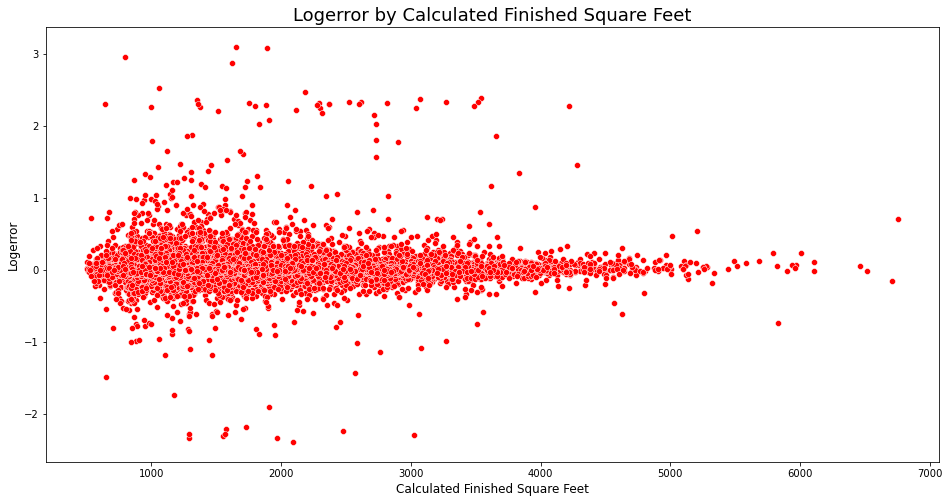

In [37]:
# Visualizing how logerror is correlated with square feet
plt.figure(figsize = (16,8))
sns.scatterplot(x = train.living_sqft, y = train.logerror, color = 'red', data = train)
plt.xlabel('Calculated Finished Square Feet', fontsize = 12)
plt.ylabel('Logerror', fontsize = 12)
plt.title('Logerror by Calculated Finished Square Feet', fontsize = 18)

## Question 4: Is log error significantly different with different size of bed/bath (num. of bed/bath; small/medium/large)

#### Bedrooms

<AxesSubplot:xlabel='bedrooms', ylabel='logerror'>

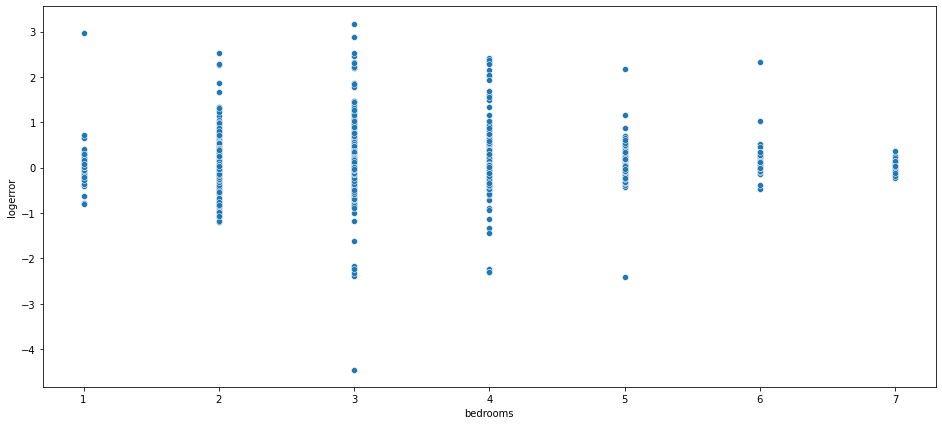

In [41]:
plt.figure(figsize = (16,7))
sns.scatterplot(x='bedrooms', y='logerror', data = train)

#### Bathrooms

<AxesSubplot:xlabel='bathrooms', ylabel='logerror'>

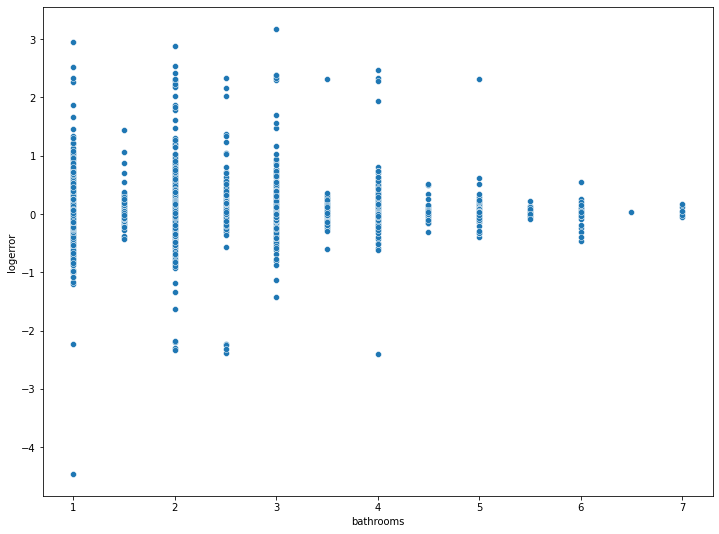

In [42]:
plt.figure(figsize = (12,9))
sns.scatterplot(x='bathrooms', y='logerror', data = train)

#### Fullbath

<AxesSubplot:xlabel='full_bath', ylabel='logerror'>

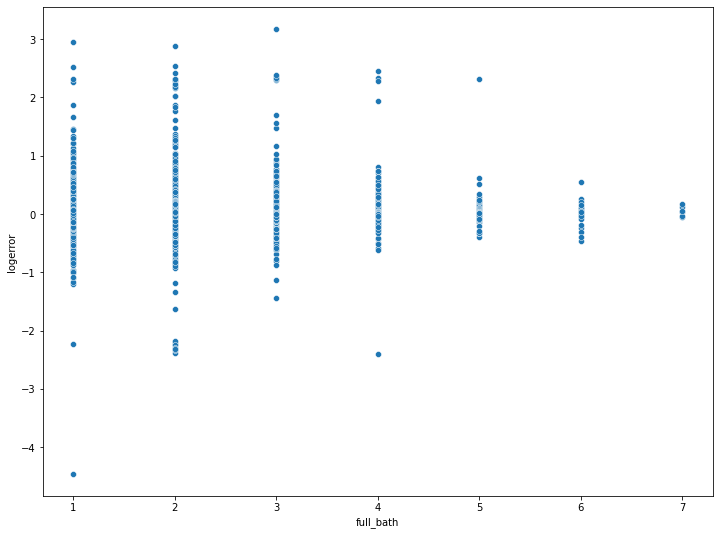

In [43]:
plt.figure(figsize = (12,9))
sns.scatterplot(x='full_bath', y='logerror', data = train)

#### Total Room

<AxesSubplot:xlabel='roomcnt', ylabel='logerror'>

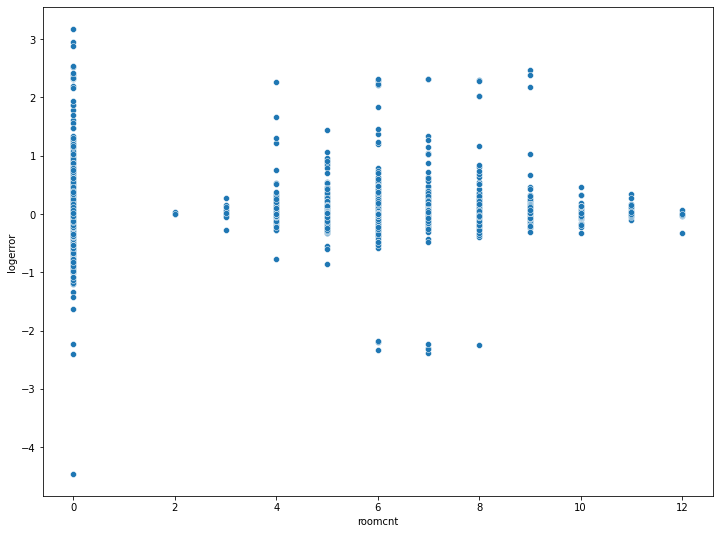

In [44]:
plt.figure(figsize = (12,9))
sns.scatterplot(x='roomcnt', y='logerror', data = train)

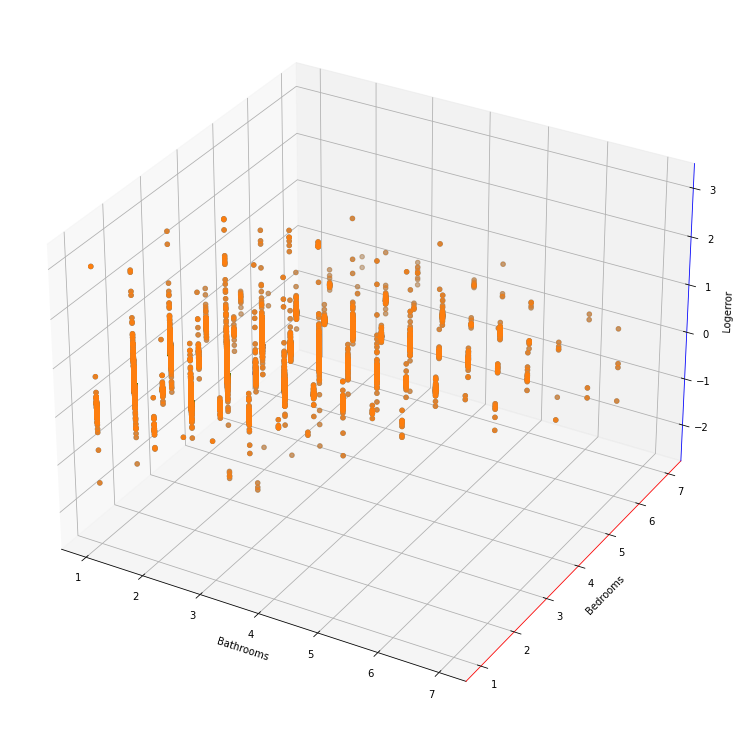

In [82]:
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure()
fig.set_size_inches(20,10)
ax = Axes3D(fig)

x = train.bathrooms
y = train.bedrooms
z = train.logerror
ax.scatter(x, y, z)
ax.set_xlabel("Bathrooms")
ax.set_ylabel("Bedrooms")
ax.set_zlabel("Logerror")
ax.w_yaxis.line.set_color("red")
ax.w_zaxis.line.set_color("blue")
ax.scatter(x, y, z)

plt.show()

In [46]:
fig = px.scatter_3d(df, x='bedrooms', y='bathrooms', z='logerror',
              color='logerror')
fig.update_layout(width=900, height=700)
# fig.update_layout(margin={"r":0,"t":0,"l":10,"b":0})
fig.show()

## Question 5: Is log error correlated with `assessed_value`, `taxamount`, `structure_value`, `land_value`?

**assessed_value**

<AxesSubplot:xlabel='assessed_value', ylabel='logerror'>

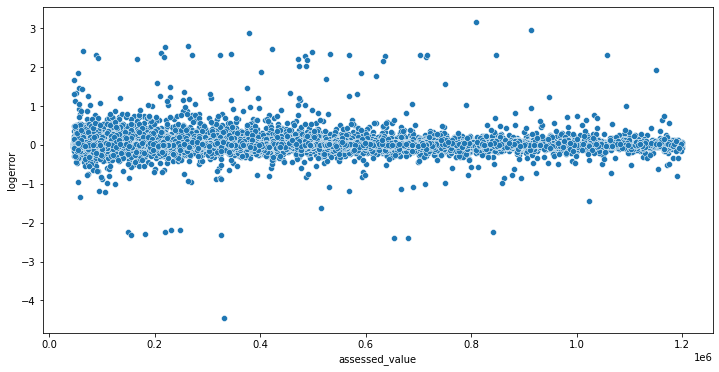

In [49]:
plt.figure(figsize = (12,6))
sns.scatterplot(x='assessed_value', y='logerror', data = train)

**land_value**

<AxesSubplot:xlabel='land_value', ylabel='logerror'>

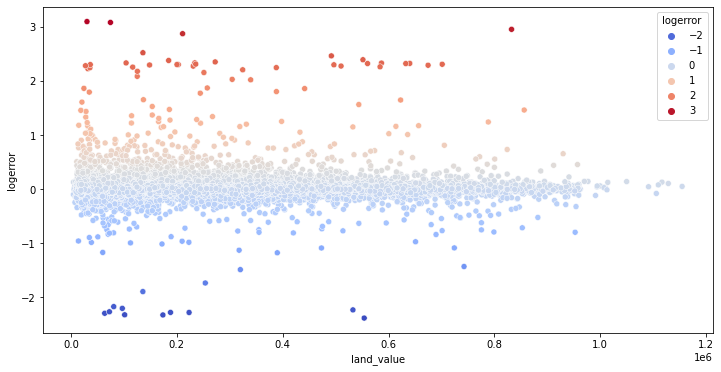

In [50]:
plt.figure(figsize = (12,6))
sns.scatterplot(x='land_value', y='logerror', hue='logerror', palette='coolwarm', data = train)

**structure_value**

<AxesSubplot:xlabel='structure_value', ylabel='logerror'>

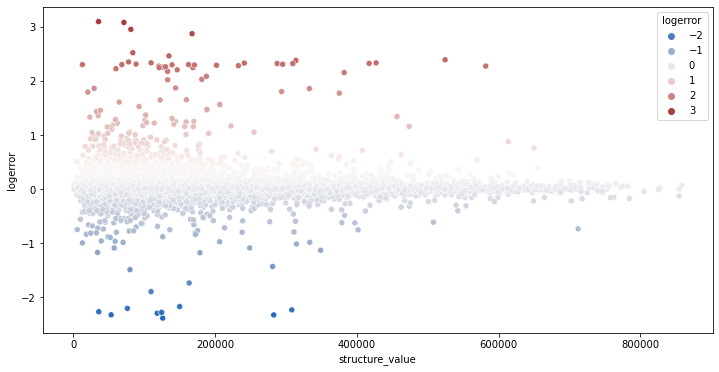

In [52]:
plt.figure(figsize = (12,6))
sns.scatterplot(x='structure_value', y='logerror', hue='logerror', palette='vlag', data = train)

**taxamount**

<AxesSubplot:xlabel='taxamount', ylabel='logerror'>

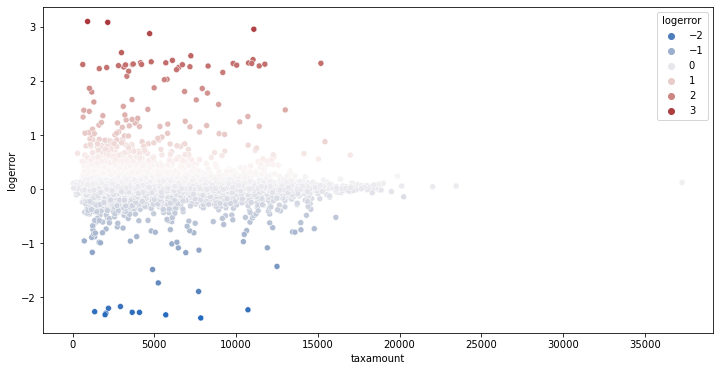

In [53]:
plt.figure(figsize = (12,6))
sns.scatterplot(x='taxamount', y='logerror', hue='logerror', palette='vlag', data = train)

## Question 6: Is log error correlated with `transaction_month`

<AxesSubplot:xlabel='transaction_month', ylabel='logerror'>

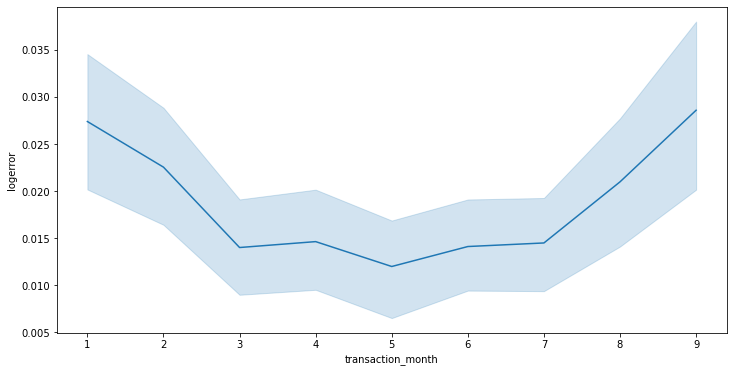

In [43]:
plt.figure(figsize = (12,6))
sns.lineplot(x='transaction_month', y='logerror', data = train)

<AxesSubplot:xlabel='transaction_month', ylabel='logerror'>

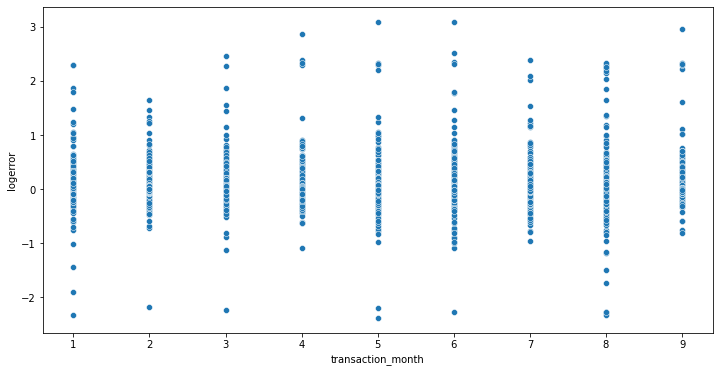

In [44]:
plt.figure(figsize = (12,6))
sns.scatterplot(x='transaction_month', y='logerror', data = train)

In [54]:
logerror_month = train.groupby('transaction_month').logerror.mean().reset_index()

In [61]:
for row in range(0,9):
    alpha = 0.05
    sample = train[train.transaction_month ==logerror_month['transaction_month'][row]].logerror
    t, p = stats.ttest_1samp(sample, overall_mean)
    if p/2 < alpha:
        print('transaction month ', logerror_month['transaction_month'][row], 'is significantly')
        if t>0:
            print('higher than the overall mean error.')
        else:
            print('lower than the overall mean error.')

transaction month  1 is significantly
higher than the overall mean error.
transaction month  5 is significantly
lower than the overall mean error.
transaction month  9 is significantly
higher than the overall mean error.


In [69]:
logerror_month

,transaction_month,logerror
0,1,0.027397
1,2,0.022544
2,3,0.013998
3,4,0.014626
4,5,0.011980
5,6,0.014104
6,7,0.014483
7,8,0.020983
8,9,0.028596


In [77]:
t, p = stats.ttest_1samp(train[train.transaction_month==8].logerror, overall_mean)
if p/2 < alpha:
    print('its siginificantly')
    if t>0:
        print('higher than the overall mean error.')
    else:
        print('lower than the overall mean error.')
else:
    print('not significant')

not significant


**NOTE:**

**month 1, 9 have similar logerror mean -> siginifantly higher than average**

**month 2 belongs to its own group --> higher than average, but not significant**

**month 5 belongs to its own group --> siginificantly lower than mean**

**month 3,4,6,7 have similar logerror mean -> lower than average, but not siginificant**

**Is it worth to cluster?**

In [14]:
df.to_csv('graph.csv')